In [21]:
import pandas as pd
import matplotlib.pyplot as plt


Lendo e Analizando os dados do dataframe

In [22]:
df = pd.read_csv("filmaffinity_dataset.csv ", sep="," , encoding= 'UTF-8') 

In [23]:
print(type(df))


<class 'pandas.core.frame.DataFrame'>


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119003 entries, 0 to 119002
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  119003 non-null  int64 
 1   Título      119003 non-null  object
 2   Año         119003 non-null  int64 
 3   País        119003 non-null  object
 4   Dirección   118202 non-null  object
 5   Reparto     94525 non-null   object
 6   Nota        119003 non-null  object
 7   Tipo filme  119003 non-null  object
 8   Género      119003 non-null  object
dtypes: int64(2), object(7)
memory usage: 8.2+ MB


Tradudzindo o nome das colunas

In [25]:
df.columns

Index(['Unnamed: 0', 'Título', 'Año', 'País', 'Dirección', 'Reparto', 'Nota',
       'Tipo filme', 'Género'],
      dtype='object')

In [27]:
traducoes = {
    'Unnamed': 'Unnamed',
    'Título': 'Titulo', 
    'Año': 'Ano',
    'País': 'País',
    'Dirección': 'Diretor',
    'Reparto': 'Elenco',
    'Nota':  'Nota',
    'Tipo filme': 'Tipo de filme',
    'Género': 'Gênero',
}


novas_colunas = []
for chave, valor in traducoes.items():
    novas_colunas.append(valor)

print(novas_colunas)

['Unnamed', 'Titulo', 'Ano', 'País', 'Diretor', 'Elenco', 'Nota', 'Tipo de filme', 'Gênero']


In [28]:
df.columns = novas_colunas
df.head()

,Unnamed,Titulo,Ano,País,Diretor,Elenco,Nota,Tipo de filme,Gênero
0,0,'49-'17,1917,Estados Unidos,Ruth Ann Baldwin,"Joseph W. Girard, Leo Pierson, William Dyer, M...",--,Película,Western
1,1,"10,000 Years B.C. (C)",1916,Estados Unidos,Willis H. O'Brien,NaN,"5,1",Cortometraje,Comedia
2,2,1812,1912,Rusia,"Vasili Goncharov, Kai Hansen, Aleksandr Uralsky","Pavel Knorr, Vasili Goncharov, Aleksandra Gonc...",--,Película,Drama
3,3,20.000 leguas de viaje submarino (C),1907,Francia,Georges Méliès,Georges Méliès,"6,0",Cortometraje,Fantástico
4,4,A Bad Case (C),1909,Francia,Émile Cohl,NaN,"5,3",Cortometraje,Comedia


In [10]:

df_traduzido = df.replace(['Cortometraje', 'Película', 'Documental','Estreno televisivo','Miniserie','Serie',], ['Curta metragem', 'Filme', 'Documentário','Estreia na televisão','Minisérie','Série'])

In [11]:
#df_traduzido= df.replace([])
df_traduzido 

,Unnamed,Titulo,Ano,País,Diretor,Elenco,Nota,Tipo de filme,Gênero
0,0,'49-'17,1917,Estados Unidos,Ruth Ann Baldwin,"Joseph W. Girard, Leo Pierson, William Dyer, M...",--,Filme,Western
1,1,"10,000 Years B.C. (C)",1916,Estados Unidos,Willis H. O'Brien,NaN,"5,1",Curta metragem,Comedia
2,2,1812,1912,Rusia,"Vasili Goncharov, Kai Hansen, Aleksandr Uralsky","Pavel Knorr, Vasili Goncharov, Aleksandra Gonc...",--,Filme,Drama
3,3,20.000 leguas de viaje submarino (C),1907,Francia,Georges Méliès,Georges Méliès,"6,0",Curta metragem,Fantástico
4,4,A Bad Case (C),1909,Francia,Émile Cohl,NaN,"5,3",Curta metragem,Comedia
...,...,...,...,...,...,...,...,...,...
118998,118998,Érase una vez en Venezuela,2020,Venezuela,Anabel Rodriguez Rios,"Edín Hernández, Victor Navarro, Fidelia Villasmil",--,Documentário,Documentário
118999,118999,Érase una vez en... Hollywood,2019,Estados Unidos,Quentin Tarantino,"Leonardo DiCaprio, Brad Pitt, Margot Robbie, E...","7,1",Filme,"Drama, Comedia, Thriller"
119000,119000,Érase una vez un muñeco de nieve (C),2020,Estados Unidos,"Dan Abraham, Trent Correy",Josh Gad,"5,8",Curta metragem,"Animación, Fantástico, Comedia"
119001,119001,Érase una vez...,2020,Estados Unidos,Brenda Chapman,"Angelina Jolie, David Oyelowo, Michael Caine, ...",--,Filme,"Aventuras, Fantástico"


In [12]:
df_traduzido['Tipo de filme']

0                  Filme
1         Curta metragem
2                  Filme
3         Curta metragem
4         Curta metragem
               ...      
118998      Documentário
118999             Filme
119000    Curta metragem
119001             Filme
119002             Filme
Name: Tipo de filme, Length: 119003, dtype: object

Limpando da coluna Nota as linhas com valores "--" \
Reescrevendo as "," para "." para alterar o tipo para float. \
Alterando o tipo da coluna Gênero para string

In [30]:
df_traduzido['Gênero']

1                                Comedia
3                             Fantástico
4                                Comedia
6                                  Drama
8                                Comedia
                       ...              
118992                           Comedia
118993                           Romance
118996          Ciencia ficción, Romance
118999          Drama, Comedia, Thriller
119000    Animación, Fantástico, Comedia
Name: Gênero, Length: 68294, dtype: string

In [31]:
agrupando_tfilmes = df_traduzido.groupby('Gênero')
contagem = agrupando_tfilmes['Titulo'].count()

print("Contagem de filmes")
print(contagem)

Contagem de filmes
Gênero
Acción                                                    1519
Acción, Animación                                          220
Acción, Animación, Aventuras                                99
Acción, Animación, Aventuras, Ciencia ficción               65
Acción, Animación, Aventuras, Ciencia ficción, Comedia       7
                                                          ... 
Western                                                    798
Western, Comedia                                           100
Western, Comedia, Romance                                    7
Western, Romance                                            26
Western, Thriller                                           13
Name: Titulo, Length: 784, dtype: int64


In [32]:
agrupando_tfilmes = df_traduzido.groupby('Tipo de filme')
contagem = agrupando_tfilmes['Titulo'].count()

print("Contagem de filmes")
print(contagem)

Contagem de filmes
Tipo de filme
Curta metragem           9227
Documentário             5089
Estreia na televisão     5223
Filme                   41329
Minisérie                 920
Série                    6506
Name: Titulo, dtype: int64


In [53]:
df.drop(df[df['Nota'] == '--'].index, inplace = True)
df_traduzido["Nota"] = [float(str(i).replace(",", ".")) for i in df_traduzido["Nota"]]
#df_traduzido['Nota'] = df_traduzido['Nota'].apply(lambda x: x.replace(',','.'))
df_traduzido['Gênero'] = pd.Series(df['Gênero'], dtype="string")

Transformando a coluna notas para o tipo Float

In [56]:
df_traduzido['Nota'] = df_traduzido['Nota'].astype(float)
#df['Nota'] = df['Nota'].astype(float)

Adicionando uma nota de classificação para os filmes

In [57]:
df_traduzido['Hype'] = df_traduzido['Nota'].apply(lambda  x: 'positivo' if x > 6.5
                                          else ('negativo' if x < 4
                                                else 'neutro'))
df_traduzido.sample(5)

,Unnamed,Titulo,Ano,País,Diretor,Elenco,Nota,Tipo de filme,Gênero,Hype
109242,109242,Las tinieblas,2016,México,Daniel Castro Zimbrón,"Brontis Jodorowsky, Aliocha Sotnikoff, Camila ...",46.0,Filme,"Intriga, Terror",positivo
110403,110403,Ninja a cuadros,2018,Dinamarca,"Thorbjørn Christoffersen, Anders Matthesen",NaN,58.0,Filme,"Animación, Comedia",positivo
1916,1916,Transformations élastiques (C),1909,Francia,Jean Durand,Joaquim Renez,46.0,Curta metragem,Fantástico,positivo
117640,117640,Ricos de amor,2020,Brasil,"Bruno Garotti, Anita Barbosa","Danilo Mesquita, Giovanna Lancellotti, Oscar C...",46.0,Filme,Comedia,positivo
62754,62754,Outlaw Star (Serie de TV),1998,Japón,"Wendee Lee, Mitsuru Hongo",NaN,62.0,Série,"Animación, Ciencia ficción",positivo


Ordenando os filmes pelas notas

In [58]:
orderdf = df[df['Tipo de filme'] == 'Película'].sort_values(by=['Nota'], ascending=False)
orderdf.head(3)

,Unnamed,Titulo,Ano,País,Diretor,Elenco,Nota,Tipo de filme,Gênero
28878,28878,El padrino,1972,Estados Unidos,Francis Ford Coppola,"Marlon Brando, Al Pacino, James Caan, Robert D...","9,0",Película,Drama
28882,28882,El padrino. Parte II,1974,Estados Unidos,Francis Ford Coppola,"Al Pacino, Robert De Niro, Diane Keaton, Rober...","8,9",Película,Drama
12353,12353,Doce hombres sin piedad,1957,Estados Unidos,Sidney Lumet,"Henry Fonda, Lee J. Cobb, Jack Warden, E.G. Ma...","8,7",Película,"Drama, Intriga"


Resetando o index de cada filme
Apagando coluna Unnamed

In [59]:
dataframe_o = orderdf.drop(columns=['Unnamed'])
finaldf = dataframe_o.reset_index(drop=True)
finaldf.head()

,Titulo,Ano,País,Diretor,Elenco,Nota,Tipo de filme,Gênero
0,El padrino,1972,Estados Unidos,Francis Ford Coppola,"Marlon Brando, Al Pacino, James Caan, Robert D...","9,0",Película,Drama
1,El padrino. Parte II,1974,Estados Unidos,Francis Ford Coppola,"Al Pacino, Robert De Niro, Diane Keaton, Rober...","8,9",Película,Drama
2,Doce hombres sin piedad,1957,Estados Unidos,Sidney Lumet,"Henry Fonda, Lee J. Cobb, Jack Warden, E.G. Ma...","8,7",Película,"Drama, Intriga"
3,La lista de Schindler,1993,Estados Unidos,Steven Spielberg,"Liam Neeson, Ben Kingsley, Ralph Fiennes, Caro...","8,6",Película,Drama
4,El gran dictador,1940,Estados Unidos,Charles Chaplin,"Charles Chaplin, Paulette Goddard, Jack Oakie,...","8,6",Película,Comedia


Limpamos a coluna de gênero para manter apenas o primeiro gênero indicado pelo df

In [61]:
genero = []
for i in range(len(finaldf)):
  finaldf['Gênero'][i] = finaldf['Gênero'][i].split(' ')[0]

finaldf['Gênero'] = finaldf['Gênero'].apply(lambda x: x.replace(',',''))


finaldf.head()

C:\Users\Valcineia Soares\AppData\Local\Temp\ipykernel_6284\2932743004.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finaldf['Gênero'][i] = finaldf['Gênero'][i].split(' ')[0]
C:\Users\Valcineia Soares\AppData\Local\Temp\ipykernel_6284\2932743004.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finaldf['Gênero'][i] = finaldf['Gênero'][i].split(' ')[0]
C:\Users\Valcineia Soares\AppData\Local\Temp\ipykernel_6284\2932743004.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

,Titulo,Ano,País,Diretor,Elenco,Nota,Tipo de filme,Gênero
0,El padrino,1972,Estados Unidos,Francis Ford Coppola,"Marlon Brando, Al Pacino, James Caan, Robert D...","9,0",Película,Drama
1,El padrino. Parte II,1974,Estados Unidos,Francis Ford Coppola,"Al Pacino, Robert De Niro, Diane Keaton, Rober...","8,9",Película,Drama
2,Doce hombres sin piedad,1957,Estados Unidos,Sidney Lumet,"Henry Fonda, Lee J. Cobb, Jack Warden, E.G. Ma...","8,7",Película,Drama
3,La lista de Schindler,1993,Estados Unidos,Steven Spielberg,"Liam Neeson, Ben Kingsley, Ralph Fiennes, Caro...","8,6",Película,Drama
4,El gran dictador,1940,Estados Unidos,Charles Chaplin,"Charles Chaplin, Paulette Goddard, Jack Oakie,...","8,6",Película,Comedia


In [63]:
finaldf['Gênero'].unique()

finaldf = df.replace(['Cortometraje', 'Película', 'Documental','Estreno televisivo','Miniserie','Serie',], ['Curta metragem', 'Filme', 'Documentário','Estreia na televisão','Minisérie','Série'])


In [64]:
df['Gênero']

1                                Comedia
3                             Fantástico
4                                Comedia
6                                  Drama
8                                Comedia
                       ...              
118992                           Comedia
118993                           Romance
118996          Ciencia ficción, Romance
118999          Drama, Comedia, Thriller
119000    Animación, Fantástico, Comedia
Name: Gênero, Length: 68294, dtype: object

In [225]:
#df_final = df[(df_traduzido['Nota'] > 6 )]
df_final = df[(df_traduzido['Ano'] > 1990) & (df_traduzido['Hype'] == 'positivo')]
df_final.shape

(44591, 9)

In [226]:
def plotHistogram(Ano):

    plt.figure()
    plt.hist(df_final[Ano], bins = 30, color = "Green")
    plt.xlabel(Ano)
    plt.ylabel("ìndice Hype positivas")
    plt.title(f"Dados de Frequência - {Ano}")
    plt.show()

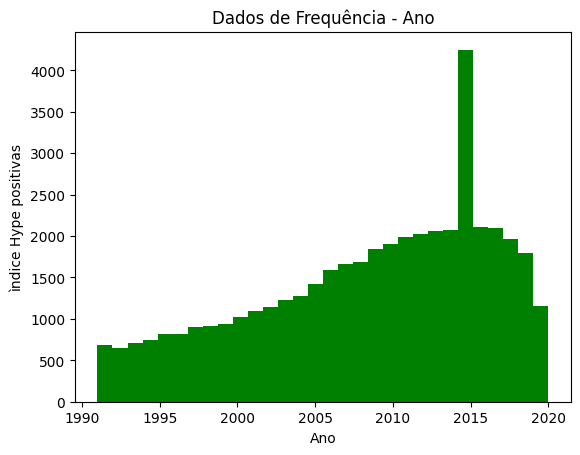

In [239]:
numerical_variables = ["Ano"]
for i in numerical_variables:
   plotHistogram(i)

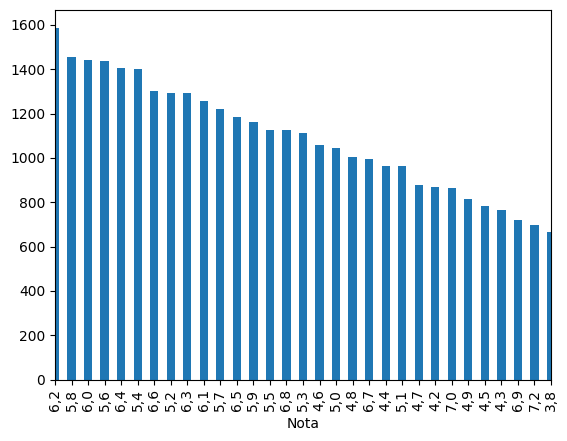

In [241]:
contagem_por_nota = df_final['Nota'].value_counts()
contagem_por_nota.plot(kind='bar')

plt.xlim(0, 30)
plt.show()

In [229]:
#contagem_por_genero = df['Gênero'].value_counts()
#contagem_por_genero
import collections


In [237]:
import numpy as np
import matplotlib.ticker as ticker

Plotando os países que mais lançaram filmes

In [230]:
df_final['País'].unique()

array(['Estados Unidos', 'España', 'Islandia', 'Canadá', 'Alemania',
       'Reino Unido', 'Italia', 'Rusia', 'Francia', 'Japón',
       'Bajos (Holanda)', 'Suiza', 'Corea del Sur', 'Austria',
       'Tailandia', 'Argentina', 'Polonia', 'Portugal', 'Hong Kong',
       'Brasil', 'Bélgica', 'Irlanda', 'Irán', 'México',
       'República Checa', 'Taiwán', 'China', 'Australia', 'Cuba',
       'Nueva Zelanda', 'Finlandia', 'Venezuela', 'India', 'Colombia',
       'Marruecos', 'Perú', 'Chile', 'Macedonia', 'Suecia', 'Lituania',
       'Rumanía', 'Dinamarca', 'Hungría', 'Argelia', 'Noruega',
       'Kazajstán', 'Turquía', 'Bolivia', 'Vietnam', 'Guinea',
       'oviética (URSS)', 'Uruguay', 'Georgia', 'Túnez',
       'a y Herzegovina', 'Egipto', 'Israel', 'Croacia', 'Grecia',
       'Yugoslavia', 'Congo', 'Aruba', 'Ecuador', 'Checoslovaquia',
       'Sudáfrica', 'Armenia', 'Bielorrusia', 'Senegal', 'Nepal',
       'Ucrania', 'Estonia', 'Burkina Faso', 'Bután', 'Camboya', 'Mali',
       'Indone

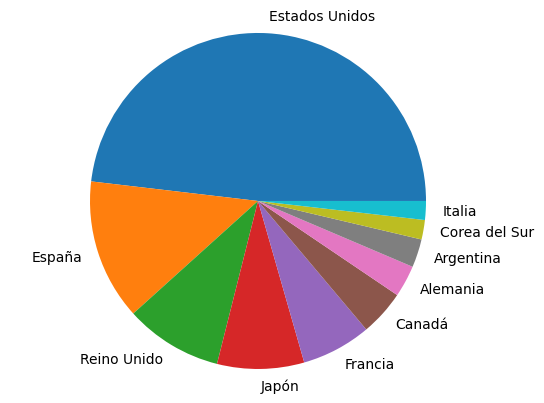

In [231]:
counter = collections.Counter(df_final['País']).most_common(10)
counter
y, x = map(list, zip(*counter))

plt.pie(x,labels = y)
plt.axis('equal')
plt.show()

In [242]:
def plotop(genero):

  drameo = df_final[df_final['Gênero'] == genero].sort_values(by=['Nota'], ascending=False)
  x = drameo['Nota'].head(5)
  y = drameo['Titulo'].head(5)

  data = {'Titulo': y.values, 'Nota': x.values}  
  plotdf = pd.DataFrame(data)  
  plotdf.plot(kind='bar',x='Titulo',y='Nota',color='pink')
  plt.xlabel('Top 5 melhores filmes de: '+ genero)
  plt.show()

In [244]:
def plotworst(genero):

 drameo = df_final[df_final['Gênero'] == genero].sort_values(by=['Nota'], ascending=True)
 x = drameo['Nota'].astype(float).head(5)
 y = drameo['Titulo'].head(5)

 data = {'Titulo': y.values, 'Nota': x.values}  
 plotdf = pd.DataFrame(data)  
 plotdf.plot(kind='bar',x='Titulo',y='Nota')
 plt.xlabel('Top 5 piores filmes de: '+ genero)
 plt.show()

In [245]:
numerical_variables = ["Drama","Comedia","Thriller","Intriga","Aventuras","Western","Acción","Terror","Animación","Fantástico","Ciencia","Romance","Infantil"]


for i in numerical_variables:
    plotop(i), plotworst(i)

TypeError: no numeric data to plot